# Configuraciones preliminares

## Carga de archivos

In [ ]:
!wget https://github.com/DiegoPincheiraIb/EL7008_Assignments/raw/main/Assignment_2/imagenes_parte_2.rar
!wget https://github.com/DiegoPincheiraIb/EL7008_Assignments/raw/main/Assignment_2/imagenes_parte_3.rar

--2022-02-21 14:17:24--  https://github.com/DiegoPincheiraIb/EL7008_Assignments/raw/main/Assignment_2/imagenes_parte_2.rar
Resolving github.com (github.com)... 192.30.255.113
Connecting to github.com (github.com)|192.30.255.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/DiegoPincheiraIb/EL7008_Assignments/main/Assignment_2/imagenes_parte_2.rar [following]
--2022-02-21 14:17:25--  https://raw.githubusercontent.com/DiegoPincheiraIb/EL7008_Assignments/main/Assignment_2/imagenes_parte_2.rar
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 233950 (228K) [application/octet-stream]
Saving to: ‘imagenes_parte_2.rar’

imagenes_parte_2.ra 100%[===================>] 228.47K  --.-KB/s    in 0.02s   

2

In [ ]:
!unrar x imagenes_parte_2.rar
!unrar x imagenes_parte_3.rar


UNRAR 5.50 freeware      Copyright (c) 1993-2017 Alexander Roshal


Extracting from imagenes_parte_2.rar

Creating    imagenes_parte_2                                          OK
Extracting  imagenes_parte_2/poligonos.png                                14%  OK 
Extracting  imagenes_parte_2/uch006a.jpg                                  67%  OK 
Extracting  imagenes_parte_2/uch101b.jpg                                  99%  OK 
Extracting  imagenes_parte_2/desktop.ini                                  99%  OK 
All OK

UNRAR 5.50 freeware      Copyright (c) 1993-2017 Alexander Roshal


Extracting from imagenes_parte_3.rar

Creating    imagenes_parte_3                                          OK
Extracting  imagenes_parte_3/left1.png                                     8%  9%  OK 
Extracting  imagenes_parte_3/left2.jpg                                    24%  OK 
Extracting  imagenes_parte_3/left3.jpg                                   

In [ ]:
!ls

imagenes_parte_2      imagenes_parte_3	    sample_data
imagenes_parte_2.rar  imagenes_parte_3.rar


Las carpetas **imagenes_parte_2** e **imagenes_parte_3** deben haberse creado.

## Instalación de librerías

In [ ]:
!pip install ipython-autotime

In [ ]:
%load_ext autotime

time: 91.1 µs (started: 2022-02-21 14:17:49 +00:00)


In [ ]:
!pip install -U opencv-python

     |████████████████████████████████| 60.4 MB 1.6 MB/s 
  Attempting uninstall: opencv-python
    Found existing installation: opencv-python 4.1.2.30
    Uninstalling opencv-python-4.1.2.30:
      Successfully uninstalled opencv-python-4.1.2.30
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.
time: 10.1 s (started: 2022-02-21 14:17:49 +00:00)


In [ ]:
# Librerias de Python
import cv2
import cython
import numpy as np
import math
# Este paquete solo se debe usar si se usa colaboratory
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt


time: 68.9 ms (started: 2022-02-21 14:17:59 +00:00)


# **Parte 2**

In [ ]:
%load_ext Cython

time: 419 ms (started: 2022-02-21 14:17:59 +00:00)


## Convolution_cython()

Esta función recibe una matriz y una máscara, retornando la convolución entre ambos elementos. El procedimiento se realiza pixel a pixel. Cabe destacar que es la misma función utilizada en la Tarea 1.

In [ ]:
%%cython
import cython
import numpy as np
cimport numpy as np

#@cython.boundscheck(False)
cpdef float[:, :] convolution_cython(float [:, :] input, float [:, :] mask):
  """
  Función que realiza la operación de convolución entre el valor de entrada
  (input), y otro elemento (mask).

  Para ello:

  1. Se definen las variables a utilizar.
  2. Se registran los tamaños tanto de la máscara como de la imagen.
  3. Se realiza la operación de convolución.


  Parametros
  ----------
  input : float
    Imagen objetivo a convolucionar
  mask : float
    Máscara objetivo a utilizar para la convolución

  Retornos
  --------
  float
    Imagen convolucionada con la máscara.
  """

  cdef int r, c, rows, cols, Rows_Mask,Cols_Mask ,Centro_Rows_Mask ,Centro_Cols_Mask 
  cdef float sum
  cdef np.ndarray output=np.zeros((input.shape[0],input.shape[1]), dtype = np.float32)

  # Tamano de la imagen
  rows = input.shape[0]
  cols = input.shape[1]

  # Tamaño de la máscara:
  Rows_Mask = mask.shape[0]
  Cols_Mask = mask.shape[1]

  Centro_Rows_Mask = Rows_Mask//2 + 1
  Centro_Cols_Mask = Cols_Mask//2 + 1

  # Se implementa convolucion entre "input" y "mask"
  for r in range(rows):
    for c in range(cols):
      sum = 0
      for index_rows_mask in range(-Centro_Rows_Mask +1, Centro_Rows_Mask):
        for index_cols_mask in range(-Centro_Cols_Mask + 1, Centro_Cols_Mask):
          Indices_Kernel_Rows = index_rows_mask + Centro_Rows_Mask -1
          Indices_Kernel_Cols = index_cols_mask + Centro_Cols_Mask -1
          new_i = r + index_rows_mask
          new_j = c + index_cols_mask
          if (new_i >=0 and new_i<rows and new_j >=0 and new_j < cols):
            sum += mask[Indices_Kernel_Rows,Indices_Kernel_Cols] * input[new_i, new_j]
      output[r, c] = sum
  return output

time: 5.51 s (started: 2022-02-21 14:18:00 +00:00)


## Gradientes

Se implementan dos funciones utilizando el **Operador Sobel**, siendo este  un operador diferencial discreto que calcula una aproximación al gradiente de la intensidad de una imagen. Este se divide en dos Kernels, representados aquí por dos funciones: GradX() y GradY(). La primera permite calcular el gradiente en la dirección X de un elemento objetivo, mientras que la segunda permite calcular el gradiente en la dirección Y de dicho elemento. Estos Kernels se convolucionan mediante la función **convolution_cython**, entregando los gradientes correspondientes.

### GradX()

In [ ]:
%%cython
import cython
import numpy as np
cimport numpy as np

from __main__ import convolution_cython


cpdef float[:, :] gradx(float [:, :] input):
  """
  Esta función calcula el gradiente en la dirección X de un elemento objetivo
  mediante el operador Sobel.

  Para ello:
  1. Se define el objeto de salida Grad_X en conjunto con la máscara Sobel a 
  utilizar.
  2. Se realiza la convolución entre la entrada y la máscara Sobel.

  Parametros
  ----------
  input : float
    Imagen a calcular el gradiente en X.
  
  Retornos
  --------
  float
    Gradiente en X de la imagen calculada.
  """
  cdef np.ndarray Grad_X=np.zeros([input.shape[0], input.shape[1]], dtype = np.float32)
  cdef np.ndarray Elem_V = np.array([[1.],[2.],[1.]], dtype = np.float32) # Kernel 1
  cdef np.ndarray Elem_H = np.array([-1.,0.,1.], dtype = np.float32) # Kernel 2
  # Se convoluciona el producto de los kernels con la imagen de entrada
  Grad_X = np.float32(convolution_cython(input, Elem_V * Elem_H))
  return Grad_X

time: 4.96 s (started: 2022-02-21 14:18:05 +00:00)


### GradY()

In [ ]:
%%cython
import cython
import numpy as np
cimport numpy as np
from __main__ import convolution_cython

cpdef float[:, :] grady(float [:, :] input):
  """
  Esta función calcula el gradiente en la dirección Y de un elemento objetivo
  mediante el operador Sobel.

  Para ello:
  1. Se define el objeto de salida Grad_Y en conjunto con la máscara Sobel a 
  utilizar.
  2. Se realiza la convolución entre la entrada y la máscara Sobel.

  Parametros
  ----------
  input : float
    Imagen a calcular el gradiente en Y.
  
  Retornos
  --------
  float
    Gradiente en Y de la imagen calculada.
  """
  cdef np.ndarray Grad_Y=np.zeros([input.shape[0], input.shape[1]], dtype = np.float32)
  cdef np.ndarray Elem_V = np.array([[-1.],[0.],[1.]], dtype = np.float32) # Kernel 1
  cdef np.ndarray Elem_H = np.array([1.,2.,1.], dtype = np.float32) # Kernel 2
  # Se convoluciona el producto de los kernels con la imagen de entrada
  Grad_Y = np.float32(convolution_cython(input, Elem_V * Elem_H))

  return Grad_Y

time: 4.48 s (started: 2022-02-21 14:18:10 +00:00)


## Product()

Esta función, dado una matriz Input1(x,y) e Input2(x,y), retorna una matriz Output cuyos elementos Output(x,y) corresponden a la multiplicación de los elementos en las posiciones x,y de las matrices Input1 e Input2.

In [ ]:
%%cython
import cython
import numpy as np
cimport numpy as np

cpdef float[:, :] product(float [:, :] input1, float [:, :] input2):
  """
  Esta función opera dos matrices Input1 e Input2 con dimensiones idénticas,
  retornando otra matriz cuyos (x,y) corresponden a la multiplicación de los
  elementos en las posiciones x,y de las matrices Input1 e Input2.

  Para ello:
  1. Se definen las variables a utilizar y los tamaños de la imagen.
  2. Se realiza la multiplicación pixel a pixel.

  Parametros
  ----------
  input1 : float
    Imagen objetivo.
  
  input2 : float
    Imagen objetivo.


  Retornos
  --------
  float
    Imagen producto de la multiplicación.
  """
  # Se inicializan las variables
  cdef np.ndarray output=np.zeros([input1.shape[0], input1.shape[1]], dtype = np.float32)
  cdef int rows,cols

  # Tamano de la imagen
  rows = input1.shape[0]
  cols = input1.shape[1]
  for r in range(rows):
    for c in range(cols):
      output[r,c] = input1[r,c] * input2[r,c] # Producto pixel a pixel
  return output

time: 3.73 s (started: 2022-02-21 14:18:15 +00:00)


## Filtro de Harris: Harris()

Esta función ,dado un set de momentos *mxx*, *myy*, *mxy* con información para cada pixel, entrega las esquinas detectadas bajo la fórmula del detector de Harris.

In [ ]:
%%cython
import cython
import numpy as np
cimport numpy as np

cpdef float[:, :] harris(float [:, :] mxx, float [:, :] mxy, float [:, :] myy):
  """
  Dado un set de momentos *mxx*, *myy*, *mxy* con información para cada pixel,
  esta función entrega las esquinas detectadas bajo la fórmula del detector de Harris.

  
  Parametros
  ----------
  mxx : float
    Matriz con momentos.
  
  mxy : float
    Matriz con momentos.

  mxy : float
    Matriz con momentos.
  

  Retornos
  --------
  float
    Imagen con esquinas detectadas bajo detector de Harris.
  """
  # Se definen las variables
  cdef np.ndarray output=np.zeros([mxx.shape[0], mxx.shape[1]], dtype = np.float32)
  cdef np.ndarray Det_mu=np.zeros([mxx.shape[0], mxx.shape[1]], dtype = np.float32)
  cdef np.ndarray Tr_mu=np.zeros([mxx.shape[0], mxx.shape[1]], dtype = np.float32)
  # Se calcula el filtro de Harris a partir de (mxx, mxy, myy)
  Det_mu = np.subtract(np.multiply(mxx,myy),np.power(mxy,2))
  Tr_mu = np.add(mxx,myy)
  output = Det_mu - 0.04*(np.power(Tr_mu,2))
  return output

time: 3.89 s (started: 2022-02-21 14:18:18 +00:00)


## Filtro de Shi-Tomasi: shiTomasi()

Esta función ,dado un set de momentos *mxx*, *myy*, *mxy* con información para cada pixel, entrega las esquinas detectadas bajo la fórmula del detector de Shi-Tomasi.

In [ ]:
%%cython
import cython
import numpy as np
cimport numpy as np
from libc.math cimport sqrt

cpdef float[:, :] shiTomasi(float [:, :] mxx, float [:, :] mxy, float [:, :] myy):
  """
  Dado un set de momentos *mxx*, *myy*, *mxy* con información para cada pixel,
  esta función entrega las esquinas detectadas bajo la fórmula del detector de Shi-Tomasi.
  Parametros
  ----------
  mxx : float
    Matriz con momentos.
  
  mxy : float
    Matriz con momentos.

  mxy : float
    Matriz con momentos.
  

  Retornos
  --------
  float
    Imagen con esquinas detectadas bajo detector de Shi-Tomasi.
  """
  # Se definen las variables
  cdef np.ndarray output=np.zeros([mxx.shape[0], mxx.shape[1]], dtype = np.float32)
  cdef np.ndarray Det_mu=np.zeros([mxx.shape[0], mxx.shape[1]], dtype = np.float32)
  cdef np.ndarray Tr_mu=np.zeros([mxx.shape[0], mxx.shape[1]], dtype = np.float32)
  cdef np.ndarray Num_Frac_2=np.zeros([mxx.shape[0], mxx.shape[1]], dtype = np.float32)
  # Se calcula el filtro de Shi-Tomasi a partir de (mxx, mxy, myy)
  Det_mu = np.subtract(np.multiply(mxx,myy),np.power(mxy,2))
  Tr_mu = np.add(mxx,myy)
  Num_Frac_2 = np.sqrt(abs(np.power(Tr_mu,2) - 4*Det_mu))
  output = (Tr_mu - Num_Frac_2)/2
  return output

time: 4.09 s (started: 2022-02-21 14:18:22 +00:00)


## getMaxima()

Dado una matriz *h* y un umbral *val*, esta función recorre pixel a pixel, verificando que cada pixel sea mayor a sus 8 vecinos y a su vez mayor al umbral, entregando una matriz con resultados binarios (el pixel es 1 si es mayor a sus 8 vecinos y además superior al umbral; en caso contrario, es 0).

In [ ]:
%%cython
import cython
import numpy as np
cimport numpy as np

cpdef float[:, :] getMaxima(float [:, :] h, float val):
  """
  Dado una matriz h y un umbral val, esta función recorre pixel a pixel,
  verificando que cada pixel sea mayor a sus 8 vecinos y a su vez mayor
  al umbral, entregando una matriz con resultados binarios:
  * Pixel == 1 si es mayor a sus vecinos y al umbral.
  * Pixel == 0 si no es mayor a sus vecinos y al umbral.


  Parametros
  ----------
  h : float
    Matriz (imagen) objetivo.
  
  val : float
    Umbral objetivo.

  Retornos
  --------
  float
    Imagen binaria con máximos detectados.
  """
  # Se crea una imagen con ceros
  cdef np.ndarray output=np.zeros([h.shape[0]+2, h.shape[1]+2], dtype = np.float32)
  cdef np.ndarray Input_Pad=np.zeros([h.shape[0]+2, h.shape[1]+2], dtype = np.float32)
  cdef int r, c, rows, cols
  rows = h.shape[0]
  cols = h.shape[1]
  Input_Pad = np.pad(h, ((1,1),(1,1)), 'constant')
  for r in range(1,rows-1):
    for c in range(1,cols-1):
      # Si el pixel objetivo es mayor a sus 8 vecinos y a su vez mayor al umbral:
      if h[r,c] == np.amax(h[r-1:r+1,c-1:c+1]) and h[r,c]>val:
        output[r,c] = 1
  return output[1:h.shape[0]+1,1:h.shape[1]+1]

time: 3.71 s (started: 2022-02-21 14:18:26 +00:00)


## getKeyPoints()

Esta función recibe una matriz correspondiente a la salida del filtro de Harris o el de Shi-Tomasi, entregando los **keypoints** o puntos de interés contenidos en la imagen.

In [ ]:
# Esta funcion genera keypoints a partir de una imagen de entrada
# La imagen de entrada puede ser la salida del filtro de Harris o el de Shi-Tomasi

def getKeyPoints(input):
  """
  Dado una imagen de entrada proveniente del filtro de harris/Shi-Tomasi, genera
  Keypoints.


  Parametros
  ----------
  input : float
    Matriz (imagen) objetivo.
  
  Retornos
  --------
  list
    Lista con los Keypoints generados.
  """
  output = []
  input_rows = input.shape[0]
  input_cols = input.shape[1]
  for r in range(input_rows):
    for c in range(input_cols):
      if input[r,c] > 0:
        kp = cv2.KeyPoint()
        kp.pt = (c,r)
        kp.size = 10
        kp.angle = 0
        output.append(kp)
  return output

time: 5.86 ms (started: 2022-02-21 14:57:56 +00:00)


## HarrisDetector()

Esta función implementa el detector de Harris, recibiendo como entrada una imagen en escala de grisses y un umbral (utilizado para la función *GetMaxima()*), retornando dos elementos: una lista que contiene los puntos de interés de la imagen, y una imagen que contiene la salida del Filtro de Harris.

In [ ]:
def harrisDetector(input: np.ndarray, val: float):
  """
  Dado una imagen objetivo y un umbral determinado, se aplica el detector de Harris
  a la imagen.

  Parámetros
  ----------
  input : np.ndarray
    Imagen objetivo en escala de grises.

  val : float
    Umbral objetivo.
  
  
  Retornos
  --------
  list :
    Listado con puntos de interés
  
  np.ndarray :
    Imagen con el filtro aplicado.
  """
  input = np.float32( input )
  # 1) Se suaviza la imagen de entrada con cv.GaussianBlur( )
  Input_Suaviz = cv2.GaussianBlur(input, ksize=(3,3), sigmaX=7)
  # 2) Se calcula gradientes imx e imy (usando funciones de cython definidas arriba)
  imx = gradx(Input_Suaviz)
  imy = grady(Input_Suaviz)
  # 3) Se calcula momentos usando la funcion product( )
  imxx = product(imx,imx)
  imxy = product(imx,imy)
  imyy = product(imy,imy)
  # 4) Se suaviza momentos imxx, imxy, imyy con cv.GaussianBlur( )
  M_imxx_Suaviz = cv2.GaussianBlur(np.float32(imxx), ksize=(3,3), sigmaX=9)
  M_imxy_Suaviz = cv2.GaussianBlur(np.float32(imxy), ksize=(3,3), sigmaX=9)
  M_imyy_Suaviz = cv2.GaussianBlur(np.float32(imyy), ksize=(3,3), sigmaX=9)
  # 5) Se aplica el filtro de Harris (usando funcion de Cython definida arriba)
  Salida_Filtro_Harris = harris(M_imxx_Suaviz,M_imxy_Suaviz,M_imyy_Suaviz)
  # 6) Se encuentra puntos maximos usando getMaxima( )
  Max_p = getMaxima(Salida_Filtro_Harris,val)
  # 7) Se genera el listado de puntos usando getKeyPoints( )
  Listado_puntos = getKeyPoints(Max_p)
  # 8) Se devuelve los puntos de interes y la imagen filtrada
  return Listado_puntos, np.float32(Salida_Filtro_Harris)

time: 13.3 ms (started: 2022-02-21 14:57:57 +00:00)


## shiTomasiDetector()

Esta función implementa el detector de Shi-Tomasi, recibiendo como entrada una imagen en blanco y negro y un umbral (utilizado para la función *GetMaxima()*), retornando dos elementos: una lista que contiene los puntos de interés de la imagen, y una imagen que contiene la salida del Filtro de Shi-Tomasi.

In [ ]:
def shiTomasiDetector(input: np.ndarray, val: float):
  """
  Dado una imagen objetivo y un umbral determinado, se aplica el detector de 
  Shi-Tomasi a la imagen.

  Parámetros
  ----------
  input : np.ndarray
    Imagen objetivo en escala de grises.

  val : float
    Umbral objetivo.
  
  
  Retornos
  --------
  list :
    Listado con puntos de interés
  
  np.ndarray :
    Imagen con el filtro aplicado.
  """
  input = np.float32( input )
  # 1) Se suaviza la imagen de entrada con cv.GaussianBlur( )
  Input_Suaviz = cv2.GaussianBlur(input, ksize=(3,3), sigmaX=7)
  # 2) Se calcula gradientes imx e imy (usando funciones de cython definidas arriba)
  imx = gradx(Input_Suaviz)
  imy = grady(Input_Suaviz)
  # 3) Se calcula momentos usando la funcion product( )
  imxx = product(imx,imx)
  imxy = product(imx,imy)
  imyy = product(imy,imy)
  # 4) Se suaviza momentos imxx, imxy, imyy con cv.GaussianBlur( )
  M_imxx_Suaviz = cv2.GaussianBlur(np.float32(imxx), ksize=(3,3), sigmaX=9)
  M_imxy_Suaviz = cv2.GaussianBlur(np.float32(imxy), ksize=(3,3), sigmaX=9)
  M_imyy_Suaviz = cv2.GaussianBlur(np.float32(imyy), ksize=(3,3), sigmaX=9)
  # 5) Se aplica el filtro de Harris (usando funcion de Cython definida arriba)
  Salida_Filtro_sTom = shiTomasi(M_imxx_Suaviz,M_imxy_Suaviz,M_imyy_Suaviz)
  # 6) Se encuentra puntos maximos usando getMaxima( )
  Max_p = getMaxima(Salida_Filtro_sTom,val)
  # 7) Se genera el listado de puntos usando getKeyPoints( )
  Listado_puntos = getKeyPoints(Max_p)
  # 8) Se devuelve los puntos de interes y la imagen filtrada
  return Listado_puntos, np.float32(Salida_Filtro_sTom)

time: 14 ms (started: 2022-02-21 14:57:57 +00:00)


### Do_rotate()

Esta función, dado una imagen objetivo y un ángulo, rota dicha imagen en el ángulo objetivo.

In [ ]:
def do_rotate(img: np.ndarray, angle: float):
  """
  Dado una imagen objetivo y un ángulo determinado, rota dicha imagen.

  Parámetros
  ----------
  input : np.ndarray
    Imagen objetivo.

  angle : float
    Ángulo objetivo.
  
  
  Retornos
  --------

  np.ndarray :
    Imagen rotada.
  """
  h = img.shape[0]
  w = img.shape[1]
  cx = w // 2
  cy = h // 2
  m = cv2.getRotationMatrix2D((cx, cy), -angle, 1.0)
  cosa = np.cos(angle * np.pi / 180.0)
  sina = np.sin(angle * np.pi / 180.0)
  nw = int((h * sina) + (w * cosa))
  nh = int((h * cosa) + (w * sina))
  m[0,2] += (nw / 2) - cx
  m[1,2] += (nh / 2) - cy
  return cv2.warpAffine(img, m, (nw, nh))

time: 9.54 ms (started: 2022-02-21 14:57:57 +00:00)


## **Ejecución Parte 2**

Se cargan los nombres de las imágenes en un diccionario, en conjunto con los umbrales utilizados para el detector de Harris y el de Shi-Tomasi. Posteriormente se itera sobre el diccionario, leyendo la imagen y creando una copia rotada, realizando despues la operación del detector de Harris/Shi-Tomasi, entregando finalmente las imágenes obtenidas por los detectores.

Resultados de filtro de Harris


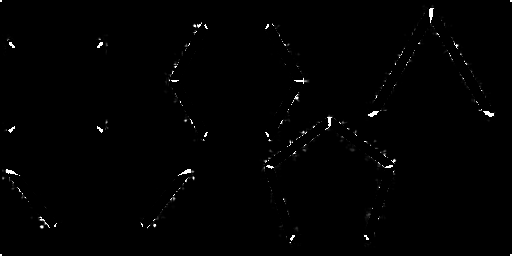

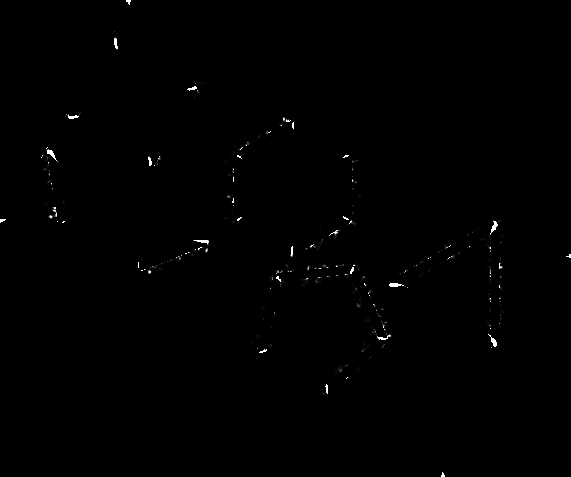

Puntos de interes


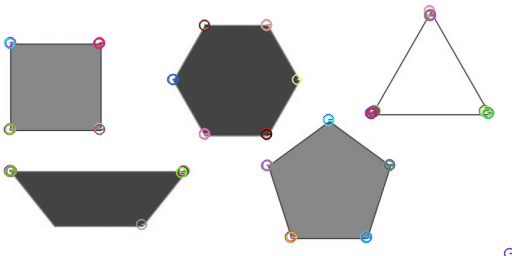

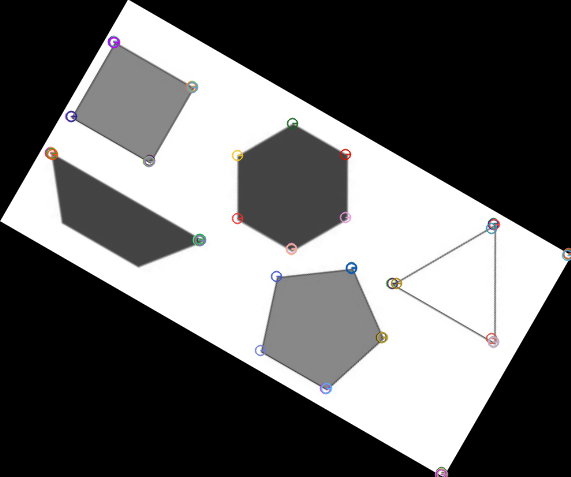

Resultados de filtro de Shi-Tomasi


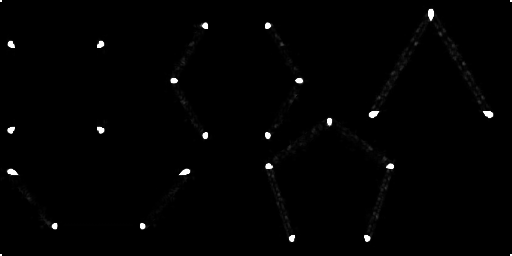

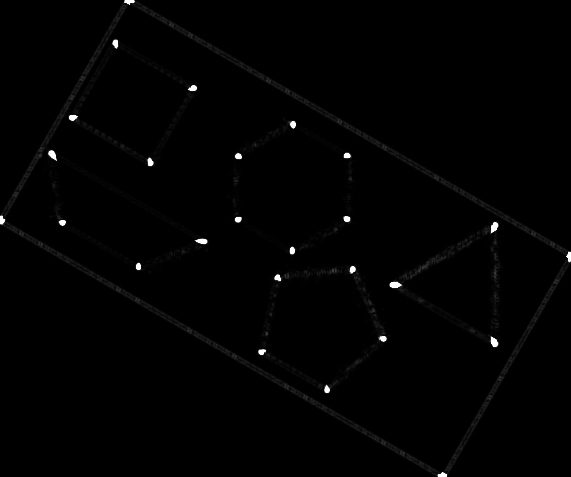

Puntos de interes


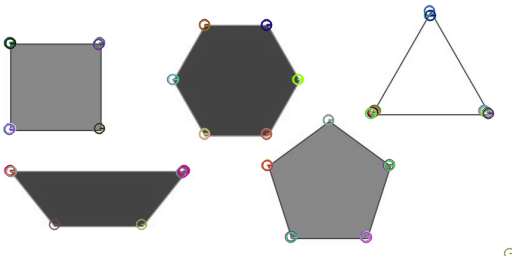

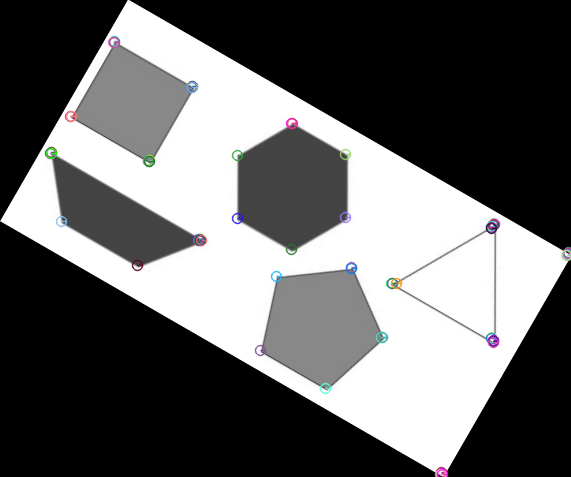

Resultados de filtro de Harris


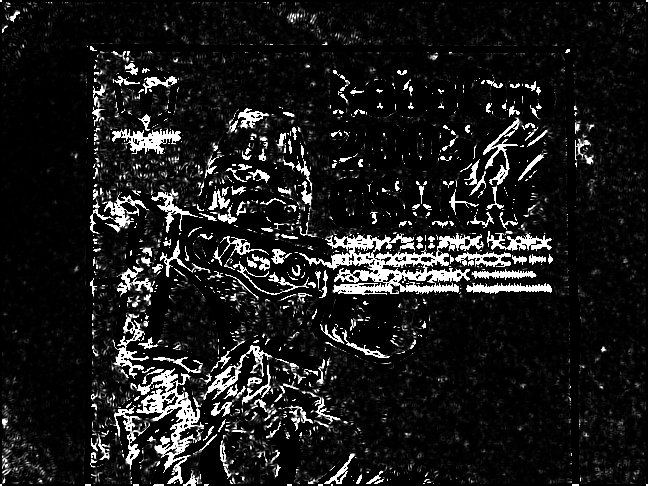

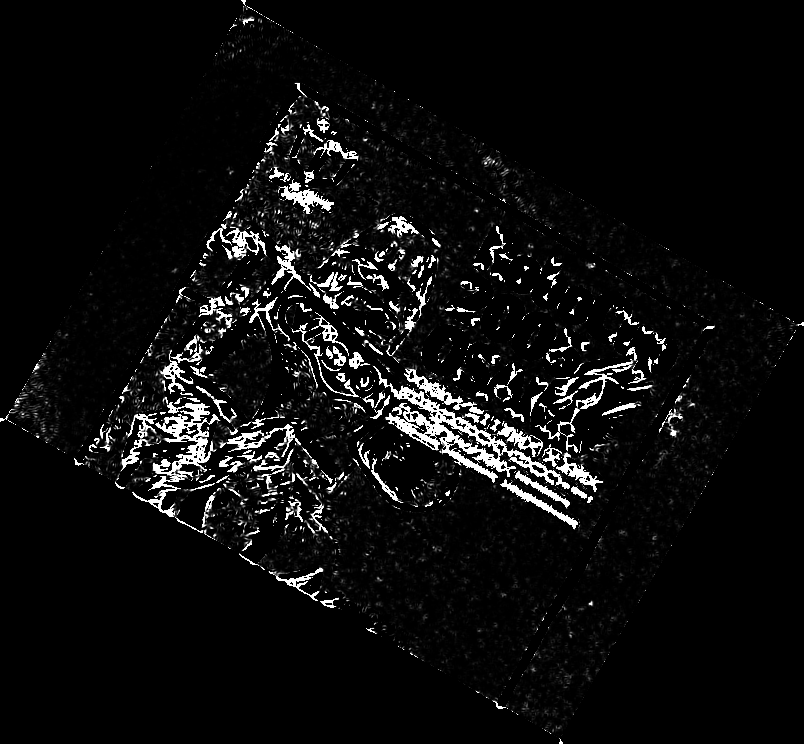

Puntos de interes


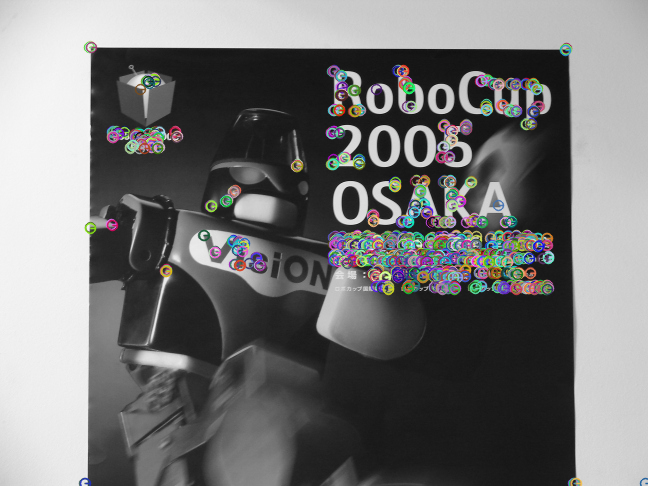

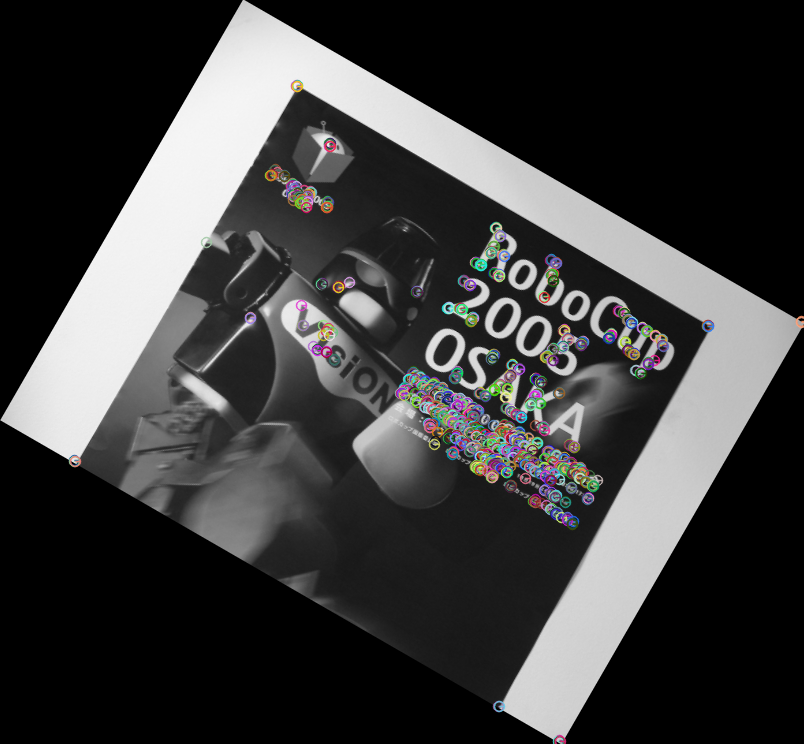

Resultados de filtro de Shi-Tomasi


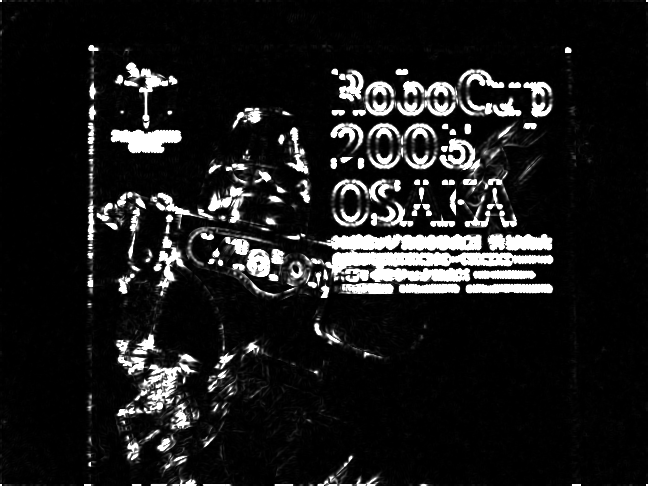

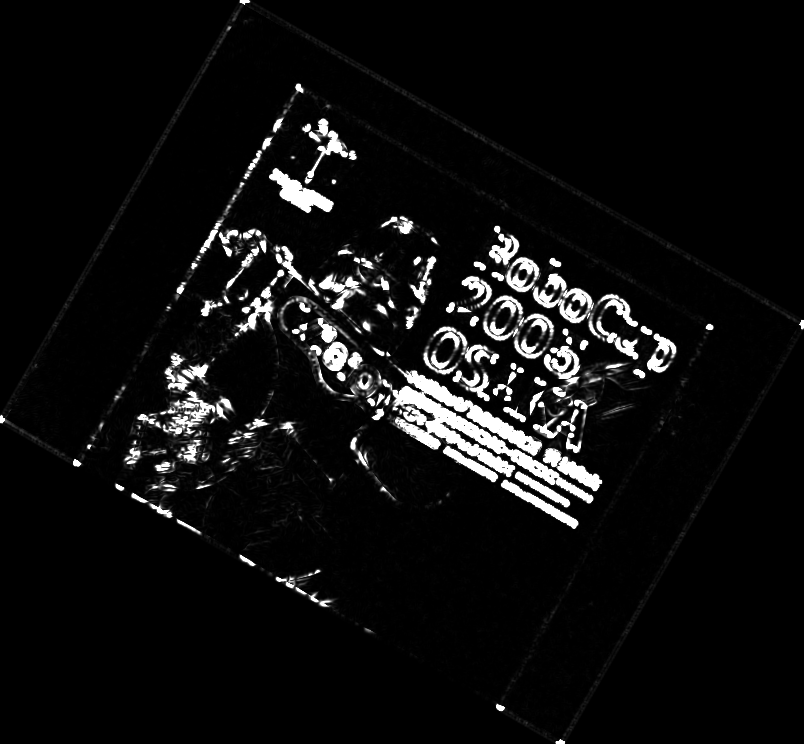

Puntos de interes


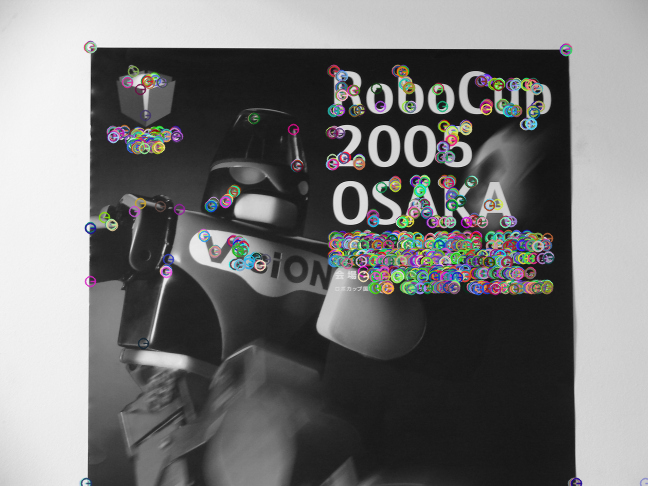

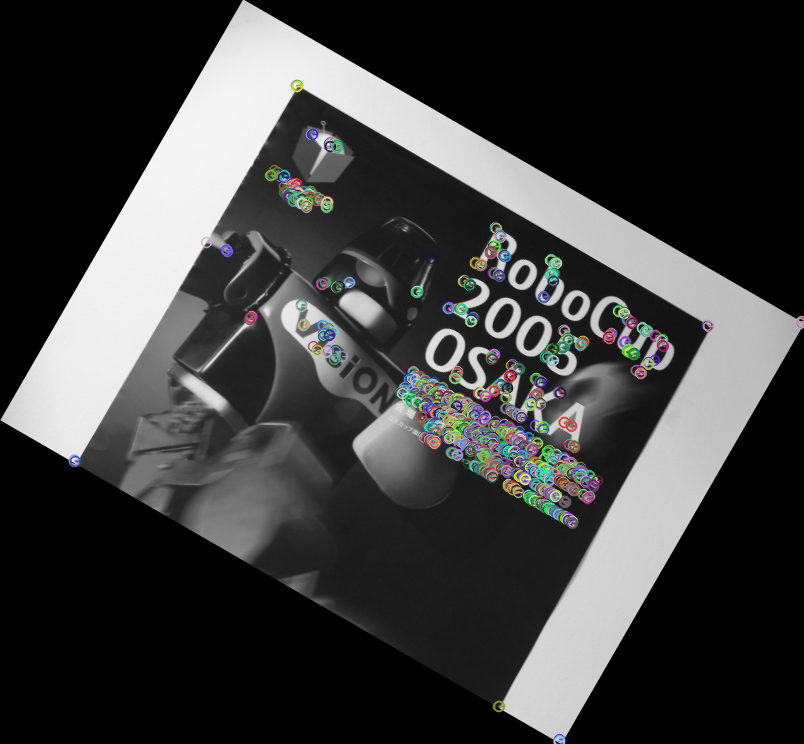

Resultados de filtro de Harris


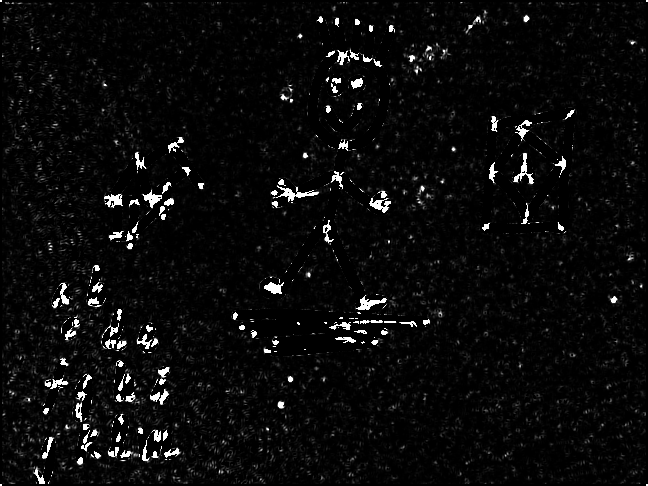

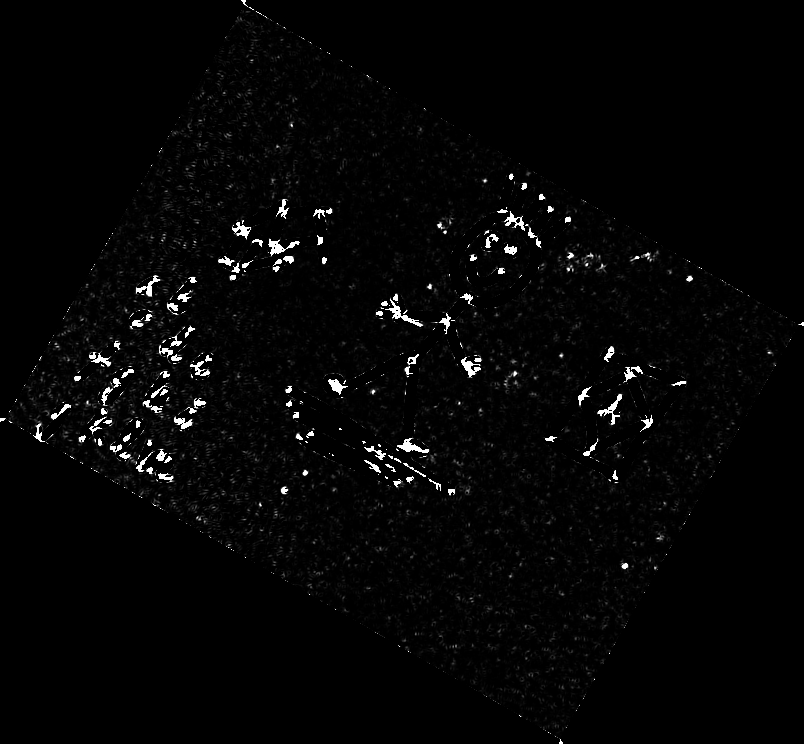

Puntos de interes


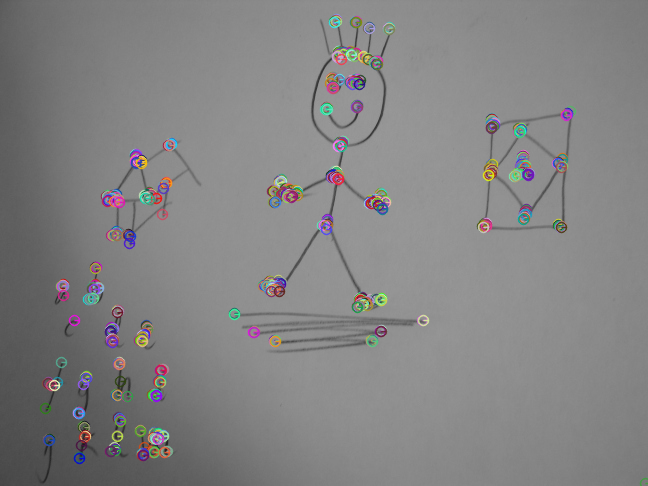

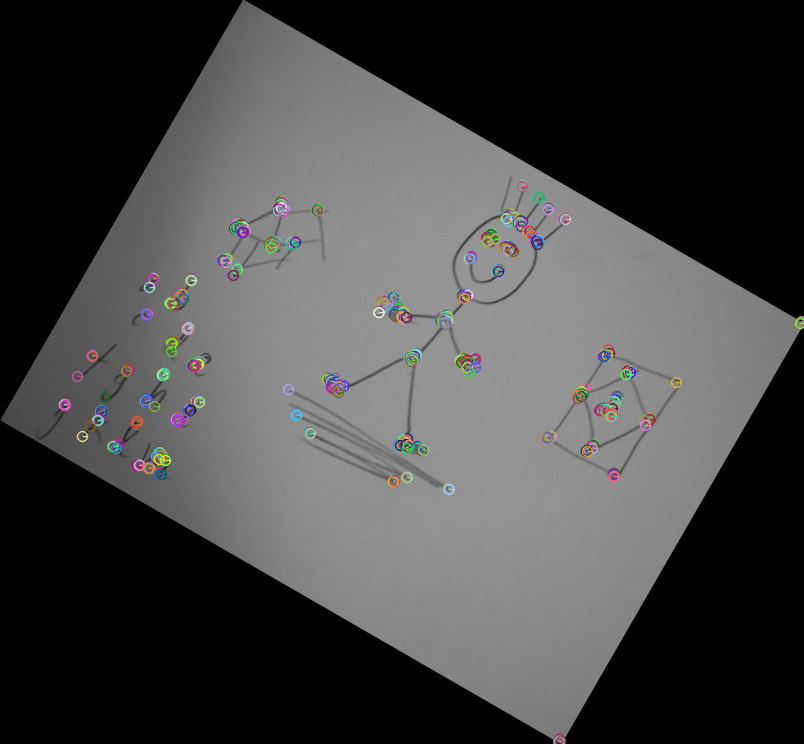

Resultados de filtro de Shi-Tomasi


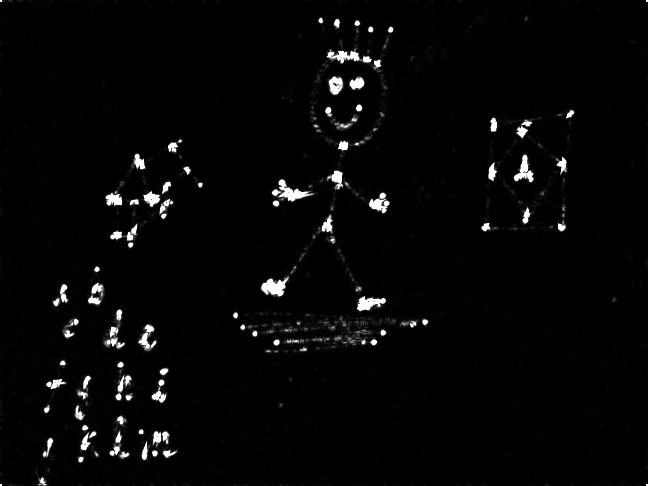

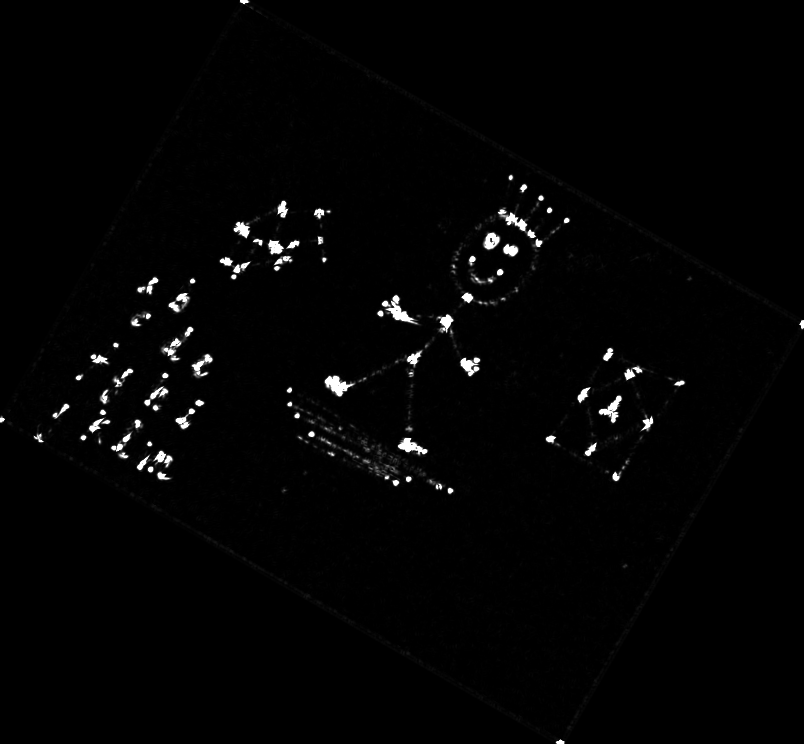

Puntos de interes


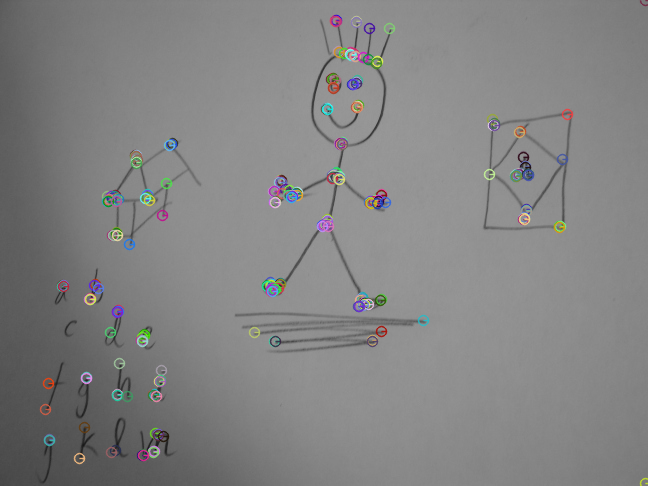

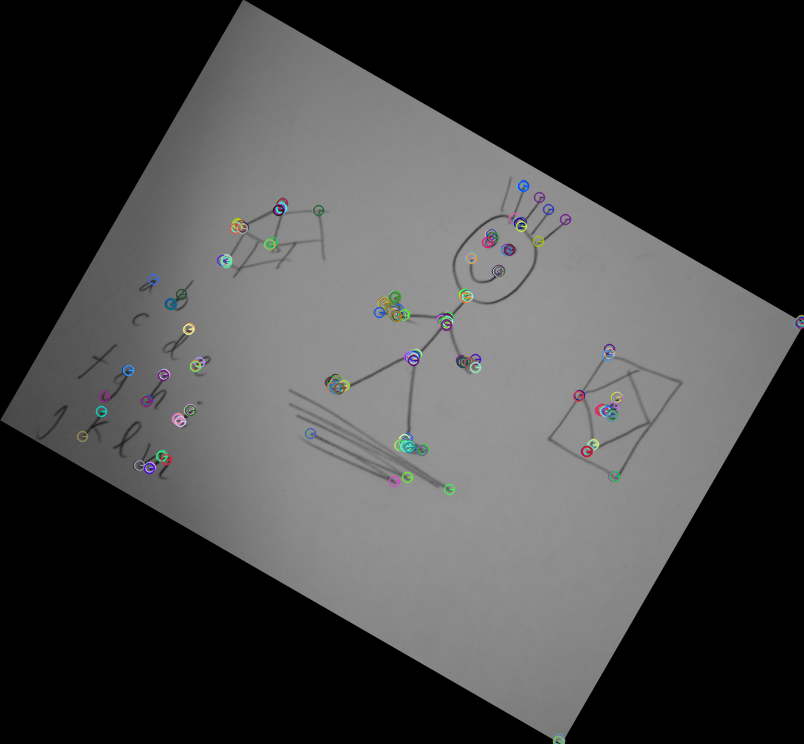

time: 1min 5s (started: 2022-02-21 14:57:57 +00:00)


In [ ]:
Directorio = "imagenes_parte_2/"

Dicc_Valores = {
    'poligonos.png':(2.5e8,7e3),
    'uch006a.jpg':(3e8,8e3),
    'uch101b.jpg':(3e6,2e3)
                }

for keys in Dicc_Valores:
  img1 = cv2.imread(Directorio + keys,0)
  img2 = do_rotate(img1, 30)

  # Detector de Harris
  kp_h1, h1 = harrisDetector(img1, Dicc_Valores[keys][0])
  kp_h2, h2 = harrisDetector(img2, Dicc_Valores[keys][0])
  res1 = cv2.drawKeypoints(img1, kp_h1, img1, None, cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  res2 = cv2.drawKeypoints(img2, kp_h2, img2, None, cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

  print('Resultados de filtro de Harris')
  cv2_imshow(h1)
  cv2_imshow(h2)
  print('Puntos de interes')
  cv2_imshow(res1)
  cv2_imshow(res2)
  # ----------------------------------

  # Detector de Shi-Tomasi
  kp_st1, st1 = shiTomasiDetector(img1, Dicc_Valores[keys][1])
  kp_st2, st2 = shiTomasiDetector(img2, Dicc_Valores[keys][1])
  res1 = cv2.drawKeypoints(img1, kp_st1, img1, None, cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  res2 = cv2.drawKeypoints(img2, kp_st2, img2, None, cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

  print('Resultados de filtro de Shi-Tomasi')
  cv2_imshow(st1)
  cv2_imshow(st2)
  print('Puntos de interes')
  cv2_imshow(res1)
  cv2_imshow(res2)

# **Parte 3**

## filterMatches()

Esta función compara calces dado un umbral fijo (en este caso, 0.75).

In [ ]:
def filterMatches(matches, umbral = 0.75):
  """
  Dado un conjunto de calces, esta función filtra aquellos bajo un umbral
  (0.75 por defecto).


  Parámetros
  ----------
  matches : 
    
  Retornos
  --------
  np.array :
    Puntos de la img 1 filtrados

  np.array :
    Puntos de la img 2 filtrados

  list :
    Listado con los calces filtrados.  
  """
  points1 = []
  points2 = []
  good = []

  for m,n in matches:
    if m.distance < umbral*n.distance:  # 0.75
      good.append([m])
      points1.append(kp1[m.queryIdx].pt)
      points2.append(kp2[m.trainIdx].pt)
  return np.array(points1), np.array(points2), good

time: 6.11 ms (started: 2022-02-21 14:59:02 +00:00)


## **Ejecución Parte 3**

Se cargan los nombres de las imágenes en un diccionario, siendo la imagen de la izquierda y la imagen de la derecha dos valores dentro de una llave. Posteriormente se itera sobre el diccionario, leyendo ambas imágenes y realizando un número de operaciones, dentro de las cuales se incluye la detección de calces de puntos y una aplicación de homografía a las imágenes de la derecha, **alineando** posteriormente la imagen de la izquierda con la imagen de la derecha alterada. Finalmente se muestran los calces realizados entre la imagen de la izquierda y la derecha, en conjunto con una imagen con ambas mitades alineadas.

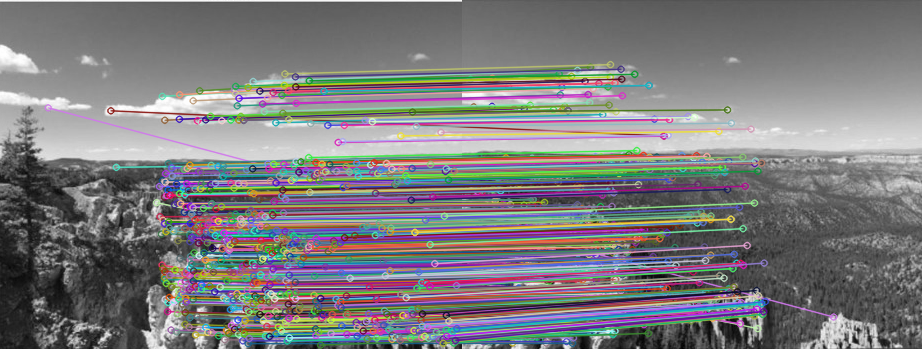

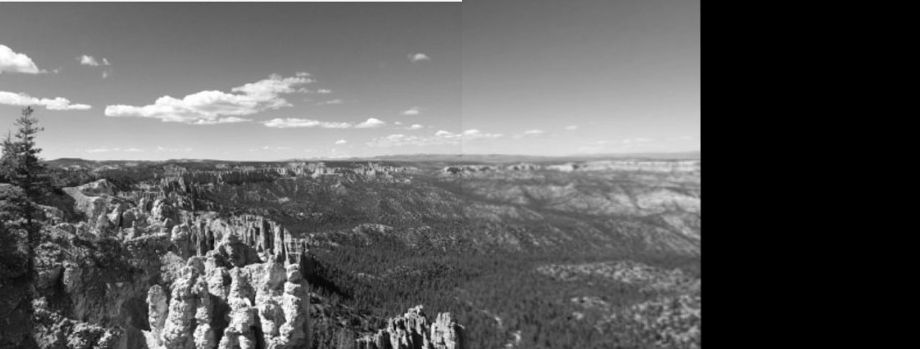

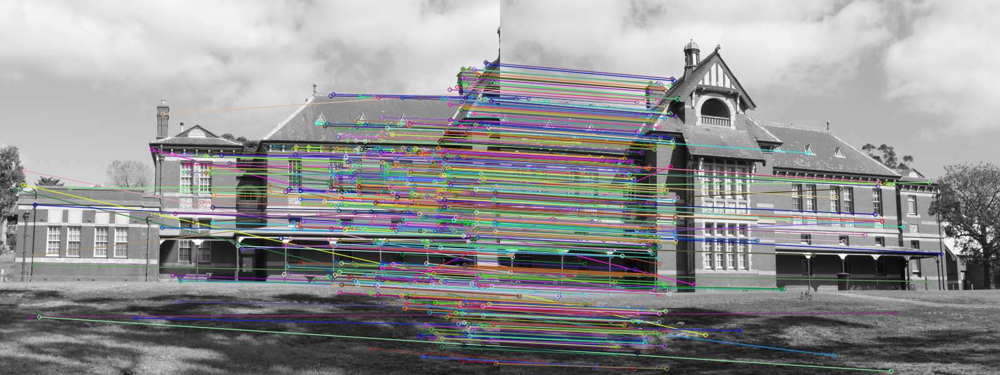

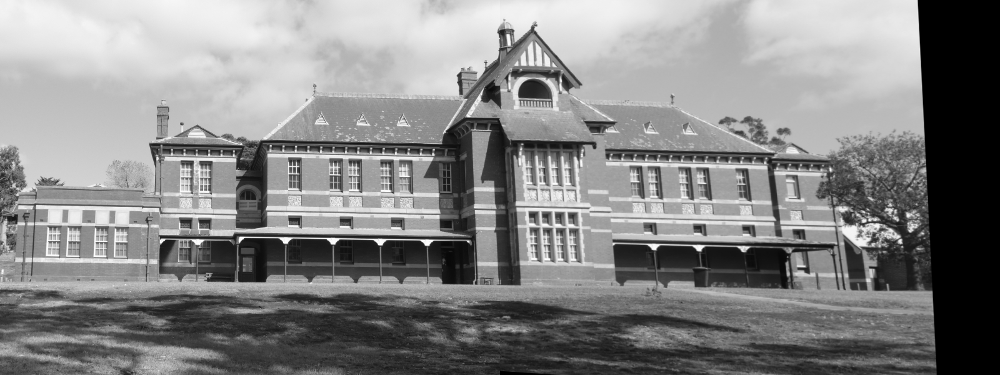

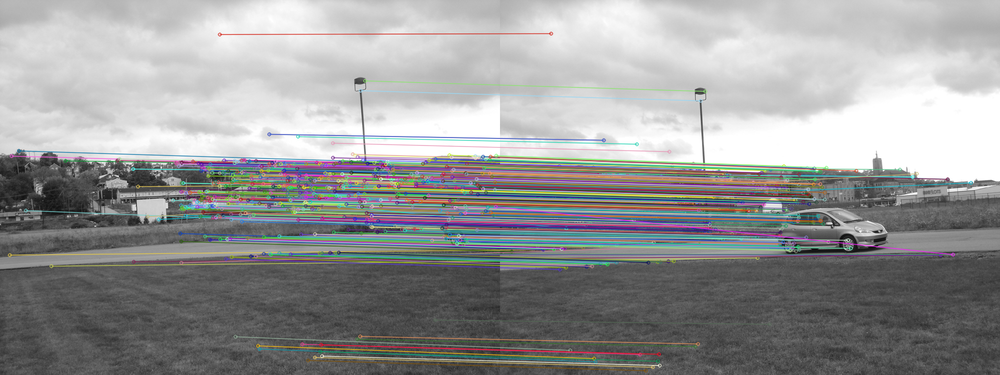

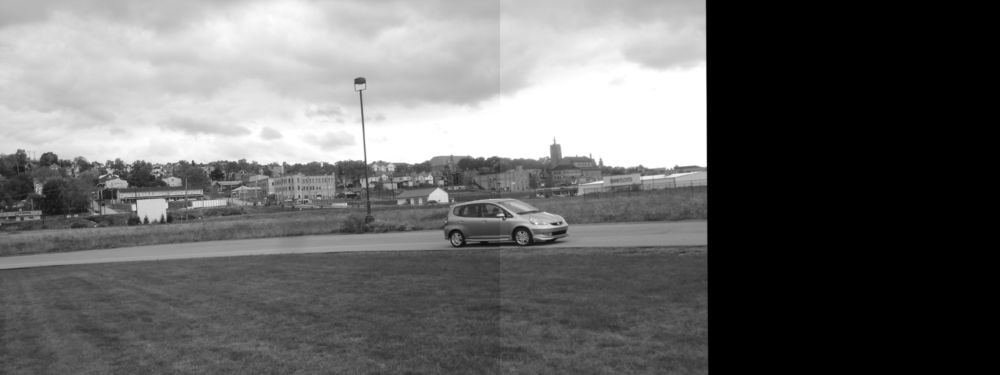

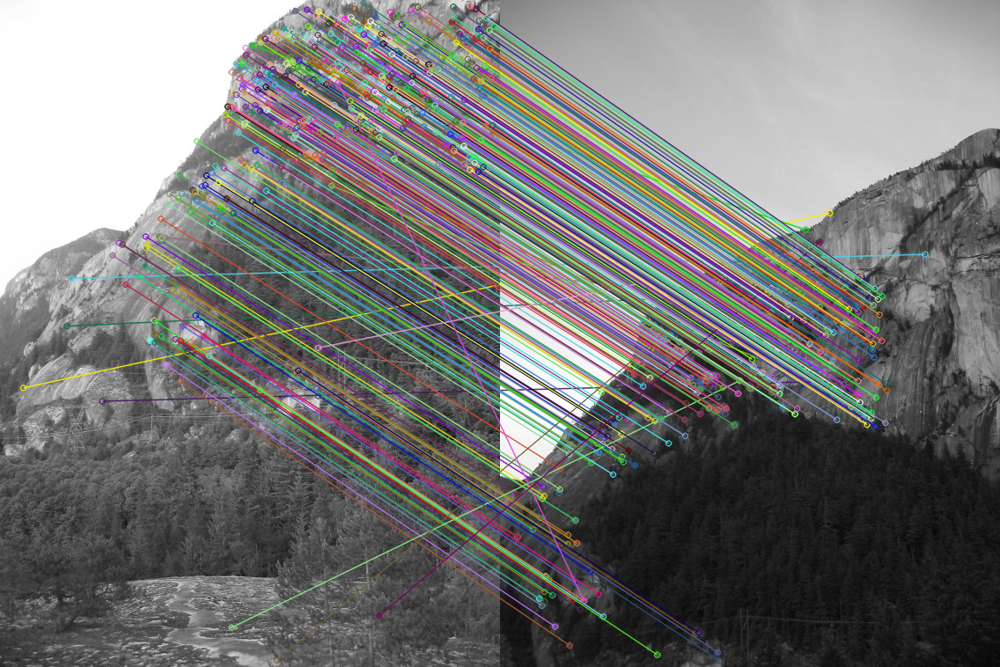

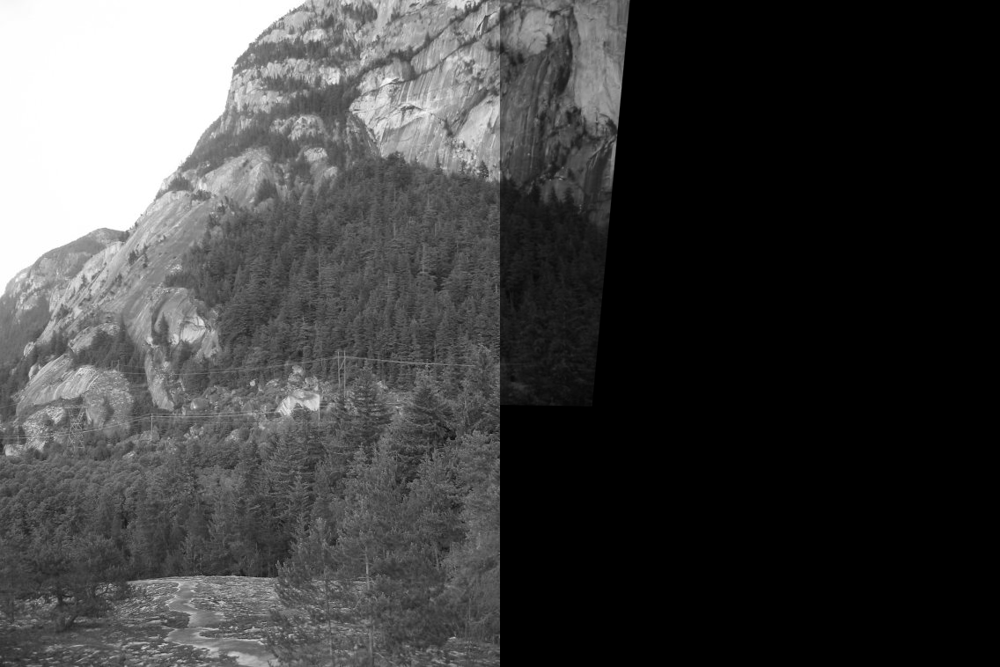

time: 3.82 s (started: 2022-02-21 14:59:02 +00:00)


In [ ]:
Directorio = "imagenes_parte_3/"


Dicc_Imgs = {
    'Imagen_1': ('left1.png','right1.png'),
    'Imagen_2': ('left2.jpg','right2.jpg'),
    'Imagen_3': ('left3.jpg','right3.jpg'),
    'Imagen_4': ('left4.jpg','right4.jpg') 
             }

for keys in Dicc_Imgs:
  img1 = cv2.imread(Directorio + Dicc_Imgs[keys][0],0)
  img2 = cv2.imread(Directorio + Dicc_Imgs[keys][1],0)
  if img1.shape[0] > img2.shape[0]:
    img1 = img1[:img2.shape[0],:]

  detector = cv2.SIFT_create()

  (kp1, des1) = detector.detectAndCompute(img1,None)
  (kp2, des2) = detector.detectAndCompute(img2,None)

  # BFMatcher with default params
  bf = cv2.BFMatcher()
  matches = bf.knnMatch(des1,des2, k=2)

  points1, points2, good = filterMatches(matches)

  img_match = cv2.drawMatchesKnn(img1, kp1, img2, kp2,
                                  good, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
  cv2_imshow(img_match)

  # Mediante las siguientes líneas se alinean dos imágenes:

  # 1) Se calcula la homografia usando cv2.findHomography( ) con parametro cv2.RANSAC
  M, mask = cv2.findHomography(points2,points1, cv2.RANSAC,5.0)
  # 2) Se tranforma la imagen img2 usando la funcion warpPerspective( ) y la homografia
  Img_X = cv2.warpPerspective(img2, M, (2*img2.shape[1],img2.shape[0]))

  # 3)Se copia la imagen img1 a la imagen resultante del paso anterior (se obtiene la imagen fusionada)
  Img_Fusionada = np.concatenate((img1,Img_X[:,img1.shape[1]:]),axis=1)
  # 4) Se muestra la imagen fusionada
  cv2_imshow(Img_Fusionada)